# Dog Breed Multi-class Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed for each test image.

## 4. Features

Image (unstructured data)

There are 120 breeds of dog = 120 classes

In [ ]:
#Unzip the data
#!unzip '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/dog-breed-identification.zip' -d '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data'
# Unzipping files in the file explorer turned out to be so slow, guess I have to try this again

In [ ]:
# Import TensorFlow into collab
import tensorflow as tf
print('TF version: ', tf.__version__)

TF version:  2.15.0


In [ ]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print('TF version: ', hub.__version__)

TF version:  0.16.1


In [ ]:
# Check for GPU availability
print('GPU', 'Yes! Available' if tf.config.list_physical_devices('GPU') else 'Not available')

GPU Not available


In [ ]:
# Checkout the labels
import pandas as pd
label_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/labels.csv')
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

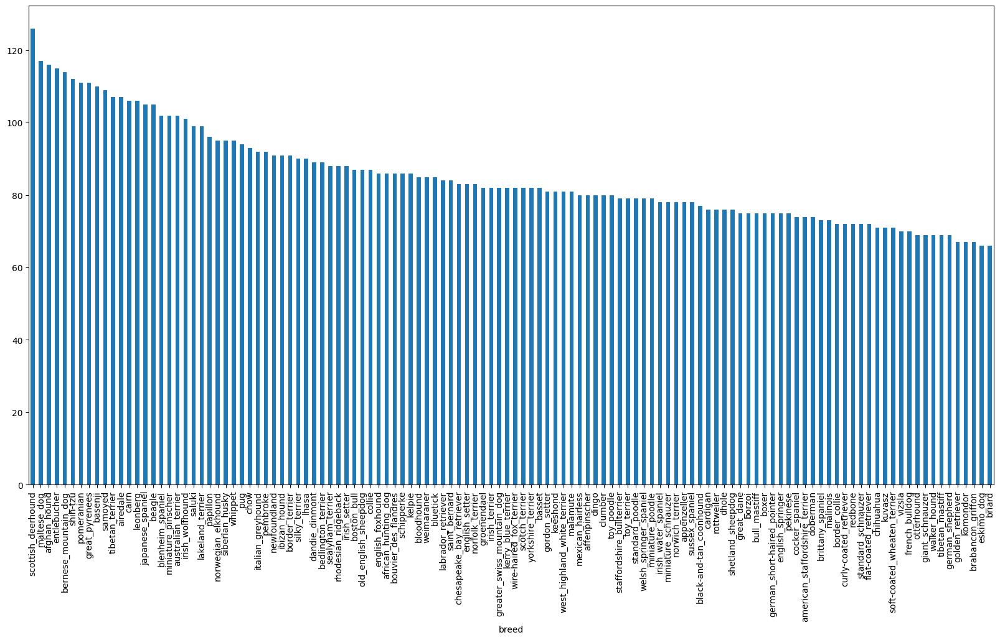

In [ ]:
# How many images in each breed
label_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

Google recommends at least 10 image per class, 100 per class is best

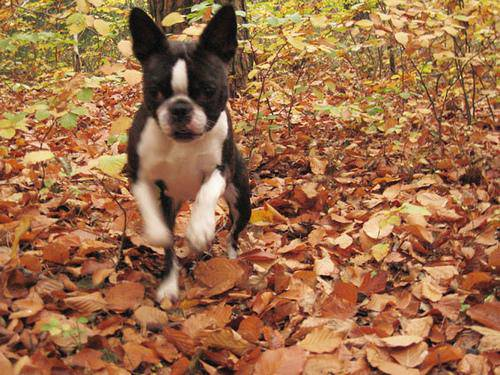

In [ ]:
# Let's view an example image would look like
from IPython.display import Image
Image('/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images and their labels

In [ ]:
# Create pathnames from image ID's
filenames = ['/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/' + fname + '.jpg' for fname in label_csv['id']]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content

In [ ]:
# Check wether number of filenames matches number of actual images
import os
if len(os.listdir('/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/train')) == len(filenames):
  print('Match. Proceed.')
else:
  print("Don't match. Check the target directory")

Match. Proceed.


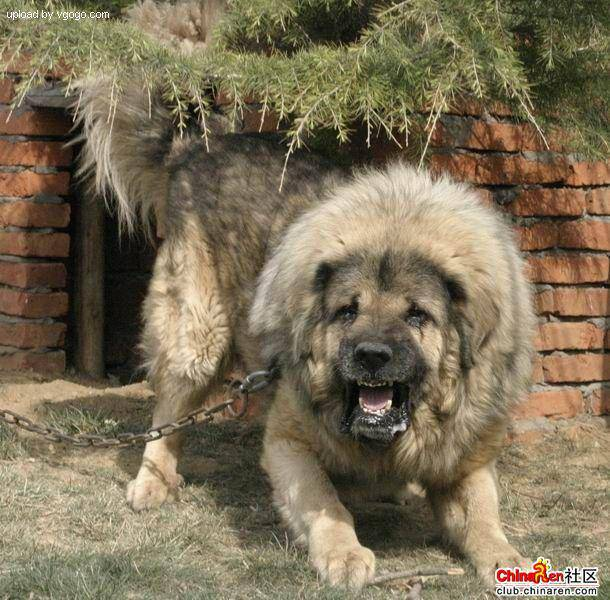

In [ ]:
Image(filenames[9000])

In [ ]:
import numpy as np
labels = label_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Match')
else:
  print("Don't match")

Match


In [ ]:
unique_breeds = np.unique(labels)

In [ ]:
# Turning data label into boolean array
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating Validation Set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to experiment with 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# Split the data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

### Preprocessing images (turning images into tensors)

In [ ]:
# First let's try converting image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[0])
image.shape

(375, 500, 3)

array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  74],
        [190, 138,  81],
        [192, 140,  82]]], dtype=uint8)
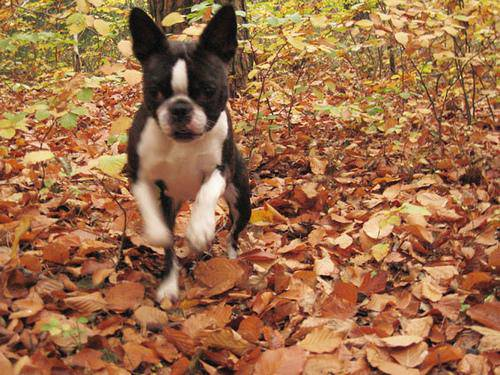

In [ ]:
image

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

### Build a function that does following:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be shape of (224, 224)
6. Return the modified image

In [ ]:
# Define Image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns the image into Tensors.
  """
  #Read an image file
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go, they all might not into memory.

So that's why we do 32 (batch size, you can change it but 32 is recommended) images at a time.

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like (`image`, `label`)

In [ ]:
# Create a simple function to return a tuple
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

def create_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image X and label y pairs
  Shuffles the data if is a training data, but doesn't shuffle the data if it's validation data
  Also accepts test data as input (no labels)
  """
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths no label
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[1.64636478e-01, 1.56793341e-01, 2.50910997e-01],
          [1.57457992e-01, 1.49614856e-01, 2.43732512e-01],
          [1.60822451e-01, 1.52979314e-01, 2.47096971e-01],
          ...,
          [2.41956413e-01, 3.05016607e-01, 2.53090918e-01],
          [2.76537061e-01, 3.22405338e-01, 2.75941789e-01],
          [3.12673271e-01, 3.51888955e-01, 3.08751702e-01]],
 
         [[1.61362991e-01, 1.53519854e-01, 2.47637510e-01],
          [1.77325621e-01, 1.69482484e-01, 2.63600141e-01],
          [1.63235307e-01, 1.55392170e-01, 2.49509826e-01],
          ...,
          [2.47338966e-01, 3.10399175e-01, 2.58473456e-01],
          [2.93224245e-01, 3.39687794e-01, 2.83775985e-01],
          [3.13185662e-01, 3.56322914e-01, 2.94768304e-01]],
 
         [[1.61077246e-01, 1.61707491e-01, 2.55510032e-01],
          [1.65765688e-01, 1.66395932e-01, 2.60198444e-01],
          [1.59762979e-01, 1.60393223e-01, 2.54195750e-01],
          ...,
          [2.59504408e-01, 3.22564632e-01, 2.7063

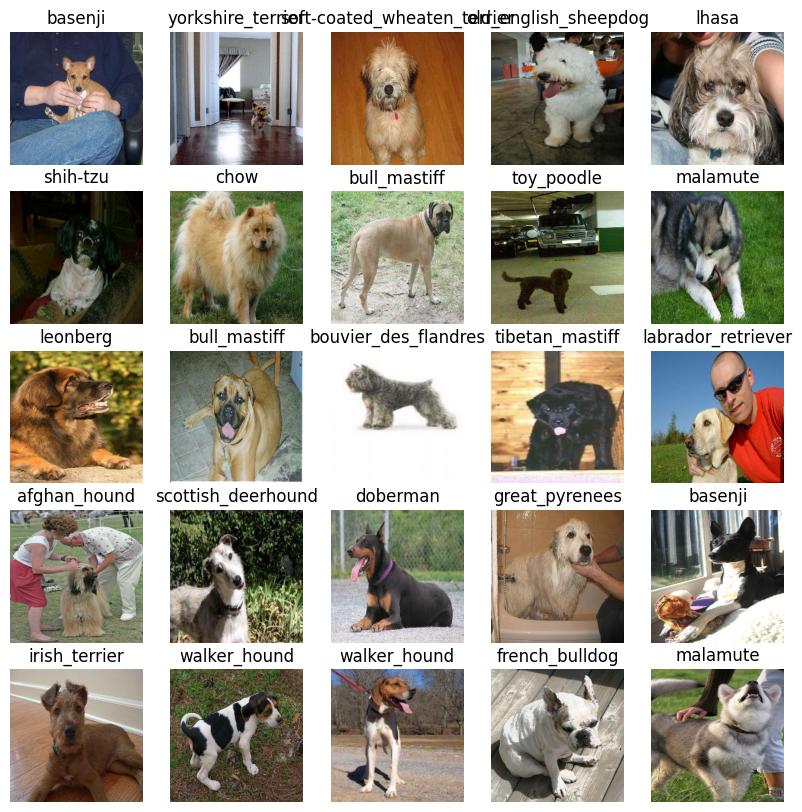

In [ ]:
show_25_images(train_images, train_labels)

### Building a model

Before we build a model, we need to define these things:


*   Input shape to our model
*   Output shape of our model
*   The URL of the model we want to use


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup the output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-feature-vector/2"

In [ ]:
# !pip -q install tensorflow==2.15

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax')
  ])

  model.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

  model.build(INPUT_SHAPE)
  return model

In [ ]:
model_1 = create_model()
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


## Creating callbacks

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                       patience=3)

In [ ]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()

  model.fit(train_data,
            epochs=100,
            validation_data=val_data,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 187s 7s/step - loss: 4.2819 - accuracy: 0.1388 - val_loss: 3.2685 - val_accuracy: 0.3450
Epoch 2/100
25/25 [==============================] - 35s 1s/step - loss: 1.7265 - accuracy: 0.7237 - val_loss: 2.0639 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 37s 2s/step - loss: 0.7236 - accuracy: 0.9362 - val_loss: 1.6177 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 35s 1s/step - loss: 0.3783 - accuracy: 0.9775 - val_loss: 1.4194 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 33s 1s/step - loss: 0.2395 - accuracy: 0.9950 - val_loss: 1.3348 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 34s 1s/step - loss: 0.1656 - accuracy: 0.9975 - val_loss: 1.2892 - val_accuracy: 0.6900
Epoch 7/100
25/25 [==============================] - 34s 1s/step - loss: 0.1261 - accuracy: 1.0000 - val_loss: 1.2478 - val_accuracy: 0.7050
Epoch 8/100


In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/logs'

<IPython.core.display.Javascript object>

## Make predictions

In [ ]:
model_preds = model.predict(val_data, verbose=1)

7/7 [==============================] - 7s 940ms/step


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[label.argmax()])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
model_pred_max_probs = tf.reduce_max(model_preds, axis=1)
model_pred_max_probs

<tf.Tensor: shape=(200,), dtype=float32, numpy=
array([0.21241166, 0.69542396, 0.9157887 , 0.21572958, 0.87510514,
       0.88558066, 0.58714616, 0.9452309 , 0.76423913, 0.5116081 ,
       0.30632913, 0.29462126, 0.58778846, 0.68620276, 0.6951922 ,
       0.617632  , 0.9110812 , 0.95451653, 0.4198466 , 0.8119064 ,
       0.21780671, 0.9224185 , 0.33258203, 0.8975241 , 0.7008468 ,
       0.4889957 , 0.8025009 , 0.57081   , 0.68162835, 0.78818077,
       0.2913693 , 0.71138746, 0.39499843, 0.45781794, 0.8218301 ,
       0.49494615, 0.91686153, 0.4997086 , 0.22238854, 0.5582133 ,
       0.9222792 , 0.59024084, 0.7525052 , 0.8362601 , 0.41352424,
       0.77826834, 0.86907846, 0.7326456 , 0.37875217, 0.30912307,
       0.925787  , 0.34466347, 0.2971323 , 0.8693279 , 0.7806007 ,
       0.641197  , 0.8251746 , 0.56477946, 0.83937305, 0.6690574 ,
       0.37079707, 0.29578674, 0.68541646, 0.3752158 , 0.22718886,
       0.49733353, 0.8307699 , 0.42478976, 0.85467356, 0.12434851,
       0.96160

In [ ]:
model_pred_labels = tf.argmax(model_preds, axis=1)
model_pred_labels = [unique_breeds[i] for i in model_pred_labels]
model_pred_labels[:10]

['lhasa',
 'scotch_terrier',
 'basset',
 'scottish_deerhound',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'collie']

In [ ]:
import pandas as pd
model_preds_df = pd.DataFrame({'val_labels': val_labels,
                               'model_pred_labels': model_pred_labels,
                               'model_pred_prob': model_pred_max_probs})
model_preds_df.head()

,val_labels,model_pred_labels,model_pred_prob
0,cairn,lhasa,0.212412
1,scotch_terrier,scotch_terrier,0.695424
2,basset,basset,0.915789
3,bluetick,scottish_deerhound,0.215730
4,airedale,airedale,0.875105


In [ ]:
top_9_correct_preds = model_preds_df[model_preds_df['val_labels'] == model_preds_df['model_pred_labels']].sort_values('model_pred_prob', ascending=False).head(9)
top_9_correct_preds

,val_labels,model_pred_labels,model_pred_prob
182,afghan_hound,afghan_hound,0.992423
114,saluki,saluki,0.976102
164,african_hunting_dog,african_hunting_dog,0.973062
77,groenendael,groenendael,0.972402
162,bedlington_terrier,bedlington_terrier,0.966035
101,bernese_mountain_dog,bernese_mountain_dog,0.964501
166,bedlington_terrier,bedlington_terrier,0.962301
70,mexican_hairless,mexican_hairless,0.961602
140,affenpinscher,affenpinscher,0.961003


## Visualize the performance

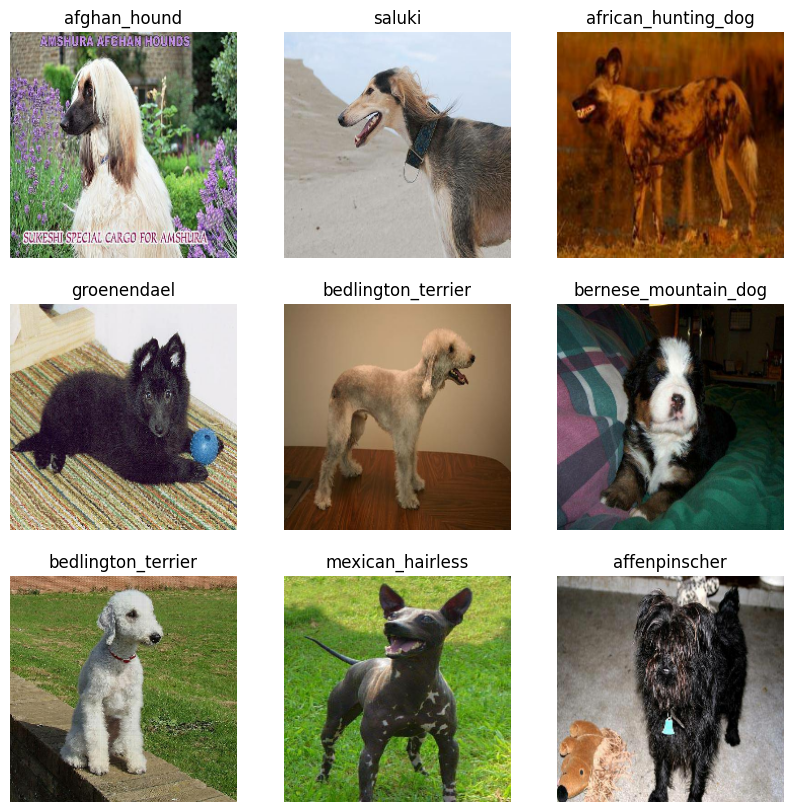

In [ ]:
# Plot top_9_correct_preds
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i+1)
  plt.imshow(val_images[top_9_correct_preds.index[i]])
  plt.axis(False)
  plt.title(top_9_correct_preds['val_labels'].iloc[i])

In [ ]:
top_9_wrong_preds = model_preds_df[model_preds_df['val_labels'] != model_preds_df['model_pred_labels']].sort_values('model_pred_prob', ascending=False).head(9)
top_9_wrong_preds

,val_labels,model_pred_labels,model_pred_prob
146,brittany_spaniel,welsh_springer_spaniel,0.936243
34,eskimo_dog,malamute,0.821830
170,kelpie,schipperke,0.791062
121,kelpie,schipperke,0.761307
47,standard_poodle,miniature_poodle,0.732646
83,appenzeller,miniature_pinscher,0.696704
199,appenzeller,cardigan,0.687040
106,silky_terrier,yorkshire_terrier,0.676092
123,norwich_terrier,cairn,0.670800


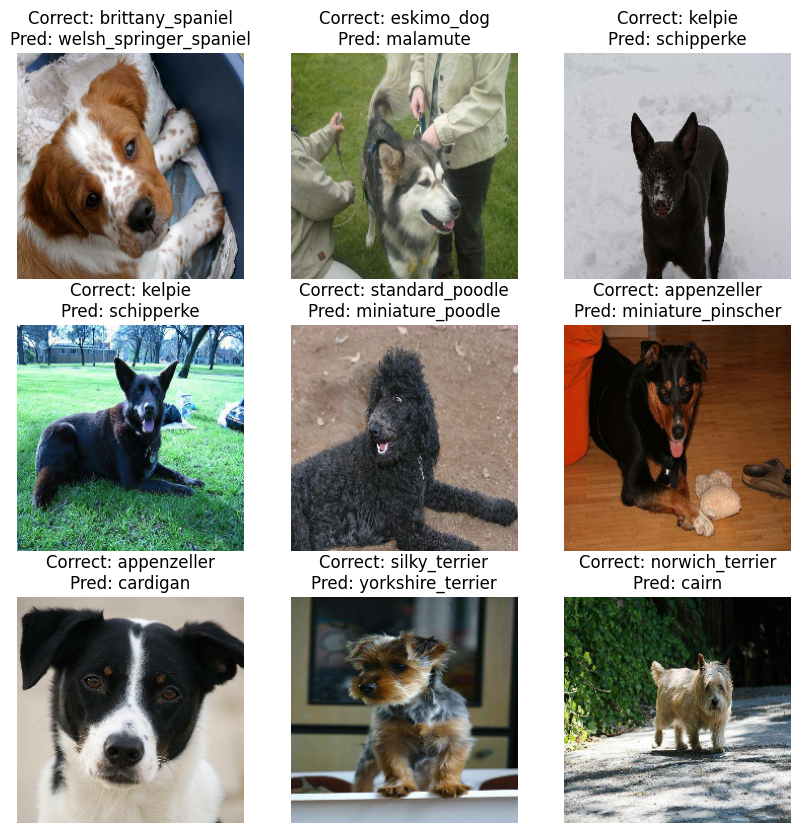

In [ ]:
# Plot the top_9_wrong_preds
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i+1)
  plt.imshow(val_images[top_9_wrong_preds.index[i]])
  plt.axis(False)
  plt.title(f'Correct: {top_9_wrong_preds["val_labels"].iloc[i]}\nPred: {top_9_wrong_preds["model_pred_labels"].iloc[i]}')

## Saving the model

In [ ]:
# Save the model
model.save('/content/drive/MyDrive/Colab Notebooks/Dog_vision_project/data/model_1')